In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append("../src")
import model.sdes as sdes
import model.generate as generate
import model.cifar_unet as cifar_unet
import model.util as model_util
from plot.plot import plot_mnist_digits
from analysis.fid import compute_fid
import torch
import torchvision
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt
import os

In [2]:
# Define device
if torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"

In [3]:
classes = list(range(100))
branch_defs = [((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99), 0.6166166166166166, 1), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99), 0.5985985985985985, 0.6166166166166166), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99), 0.5465465465465466, 0.5985985985985985), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99), 0.5415415415415415, 0.5465465465465466), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99), 0.5135135135135135, 0.5415415415415415), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99), 0.5045045045045045, 0.5135135135135135), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99), 0.5025025025025025, 0.5045045045045045), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 96, 97, 98, 99), 0.4824824824824825, 0.5025025025025025), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 96, 97, 98, 99), 0.47347347347347346, 0.4824824824824825), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 96, 97, 98, 99), 0.45245245245245247, 0.47347347347347346), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 96, 97, 98, 99), 0.44344344344344344, 0.45245245245245247), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 93, 94, 96, 97, 98, 99), 0.4094094094094094, 0.44344344344344344), ((0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 93, 94, 96, 97, 98, 99), 0.3763763763763764, 0.4094094094094094), ((0, 1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 93, 94, 96, 97, 98, 99), 0.36736736736736736, 0.3763763763763764), ((0, 1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 93, 94, 96, 97, 98, 99), 0.36036036036036034, 0.36736736736736736), ((0, 1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 93, 94, 96, 97, 98, 99), 0.2092092092092092, 0.36036036036036034), ((0, 1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 22, 23, 25, 26, 27, 28, 29, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 93, 94, 96, 97, 98, 99), 0.15, 0.2092092092092092), ((20, 24), 0.15, 0.5465465465465466), ((86,), 0, 0.6166166166166166), ((73,), 0, 0.5985985985985985), ((69,), 0, 0.5415415415415415), ((62,), 0, 0.5135135135135135), ((9,), 0, 0.5045045045045045), ((95,), 0, 0.5025025025025025), ((30,), 0, 0.4824824824824825), ((17,), 0, 0.47347347347347346), ((67,), 0, 0.45245245245245247), ((92,), 0, 0.44344344344344344), ((41,), 0, 0.4094094094094094), ((7,), 0, 0.3763763763763764), ((33,), 0, 0.36736736736736736), ((54,), 0, 0.36036036036036034), ((21,), 0, 0.2092092092092092), ((36,), 0, 0.15), ((60,), 0, 0.15), ((71,), 0, 0.15), ((61,), 0, 0.15), ((90,), 0, 0.15), ((82,), 0, 0.15), ((85,), 0, 0.15), ((25,), 0, 0.15), ((23,), 0, 0.15), ((24,), 0, 0.15), ((20,), 0, 0.15), ((27,), 0, 0.15), ((28,), 0, 0.15), ((89,), 0, 0.15), ((79,), 0, 0.15), ((94,), 0, 0.15), ((68,), 0, 0.15), ((26,), 0, 0.15), ((31,), 0, 0.15), ((63,), 0, 0.15), ((47,), 0, 0.15), ((4,), 0, 0.15), ((98,), 0, 0.15), ((51,), 0, 0.15), ((1,), 0, 0.15), ((59,), 0, 0.15), ((52,), 0, 0.15), ((96,), 0, 0.15), ((50,), 0, 0.15), ((8,), 0, 0.15), ((58,), 0, 0.15), ((55,), 0, 0.15), ((91,), 0, 0.15), ((93,), 0, 0.15), ((49,), 0, 0.15), ((12,), 0, 0.15), ((66,), 0, 0.15), ((2,), 0, 0.15), ((70,), 0, 0.15), ((83,), 0, 0.15), ((6,), 0, 0.15), ((53,), 0, 0.15), ((16,), 0, 0.15), ((19,), 0, 0.15), ((5,), 0, 0.15), ((32,), 0, 0.15), ((0,), 0, 0.15), ((43,), 0, 0.15), ((13,), 0, 0.15), ((18,), 0, 0.15), ((29,), 0, 0.15), ((48,), 0, 0.15), ((87,), 0, 0.15), ((88,), 0, 0.15), ((10,), 0, 0.15), ((39,), 0, 0.15), ((22,), 0, 0.15), ((56,), 0, 0.15), ((57,), 0, 0.15), ((40,), 0, 0.15), ((45,), 0, 0.15), ((42,), 0, 0.15), ((64,), 0, 0.15), ((75,), 0, 0.15), ((65,), 0, 0.15), ((46,), 0, 0.15), ((72,), 0, 0.15), ((74,), 0, 0.15), ((77,), 0, 0.15), ((78,), 0, 0.15), ((80,), 0, 0.15), ((84,), 0, 0.15), ((97,), 0, 0.15), ((35,), 0, 0.15), ((99,), 0, 0.15), ((76,), 0, 0.15), ((37,), 0, 0.15), ((81,), 0, 0.15), ((3,), 0, 0.15), ((11,), 0, 0.15), ((14,), 0, 0.15), ((15,), 0, 0.15), ((34,), 0, 0.15), ((38,), 0, 0.15), ((44,), 0, 0.15)]
# branch_defs = [(tuple(classes), 0, 1)]

# classes = [0, 53]
# branch_defs = [
#     ((0, 53), 0.5, 1),
#     ((0,), 0, 0.5),
#     ((53,), 0, 0.5)
# ]

In [4]:
dataset = torchvision.datasets.CIFAR100(
    "/gstore/scratch/u/tsenga5/datasets/CIFAR-100", train=True, transform=(lambda img: (np.transpose(np.asarray(img), (2, 0, 1)) / 256 * 2) - 1)
)

# Limit classes
dataset.targets = np.array(dataset.targets)
inds = np.isin(dataset.targets, classes)
dataset.data = dataset.data[inds]
dataset.targets = dataset.targets[inds]

data_loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True, num_workers=2)
sample_x, sample_y = next(iter(data_loader))
input_shape = sample_x.shape[1:]

In [5]:
# TODO: this is currently rather inefficient; a decision-tree-style structure
# would be better

def class_time_to_branch(c, t):
    """
    Given a class and a time (both scalars), return the
    corresponding branch index.
    """
    for i, branch_def in enumerate(branch_defs):
        if c in branch_def[0] and t >= branch_def[1] and t <= branch_def[2]:
            return i
    raise ValueError("Undefined class and time")
        
def class_time_to_branch_tensor(c, t):
    """
    Given tensors of classes and a times, return the
    corresponding branch indices as a tensor.
    """
    return torch.tensor([
        class_time_to_branch(c_i, t_i) for c_i, t_i in zip(c, t)
    ], device=DEVICE)

In [6]:
# Create the SDE and model
sde = sdes.VariancePreservingSDE(0.1, 20, input_shape)

t_limit = 1
model = cifar_unet.MultitaskUNet(
    len(branch_defs), t_limit=t_limit,
    shared_layers=[True, True, True, True, True, True, True, False, False]
).to(DEVICE)

os.environ["MODEL_DIR"] = "/gstore/scratch/u/tsenga5/branched_diffusion/models/trained_models/cifar_playground"

import model.train_continuous_model as train_continuous_model  # Import this AFTER setting environment

In [7]:
def plot_cifar(
    images, grid_size=(10, 5), scale=1, clip=False, title=None
):
    """
    Plots CIFAR objects. No normalization will be done.
    Arguments:
        `images`: a B x 3 x 28 x 28 NumPy array of numbers between
            0 and 1
        `grid_size`: a pair of integers denoting the number of images
            to plot horizontally and vertically (in that order); if
            more digits are provided than spaces in the grid, leftover
            digits will not be plotted; if fewer images are provided
            than spaces in the grid, there will be at most one
            unfinished row
        `scale`: amount to scale figure size by
        `clip`: if True, clip values to between 0 and 1
        `title`: if given, title for the plot
    """
    images = np.transpose(images, (0, 2, 3, 1))
    if clip:
        images = np.clip(images, 0, 1)

    width, height = grid_size
    num_images = len(images)
    height = min(height, num_images // width)

    figsize = (width * scale, (height * scale) + 0.5)

    fig, ax = plt.subplots(
        ncols=width, nrows=height,
        figsize=figsize, gridspec_kw={"wspace": 0, "hspace": 0}
    )
    if height == 1:
        ax = [ax]
    if width == 1:
        ax = [[a] for a in ax]

    for j in range(height):
        for i in range(width):
            index = i + (width * j)
            ax[j][i].imshow(images[index], cmap="gray", aspect="auto", interpolation=None)
            ax[j][i].axis("off")
    if title:
        ax[0][0].set_title(title)
    plt.subplots_adjust(bottom=0.25)
    return fig

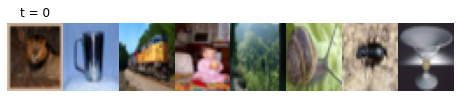

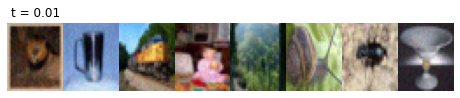

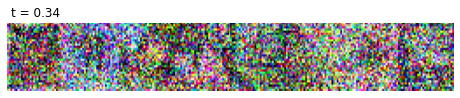

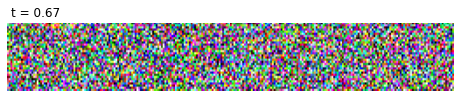

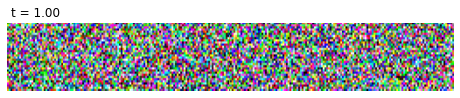

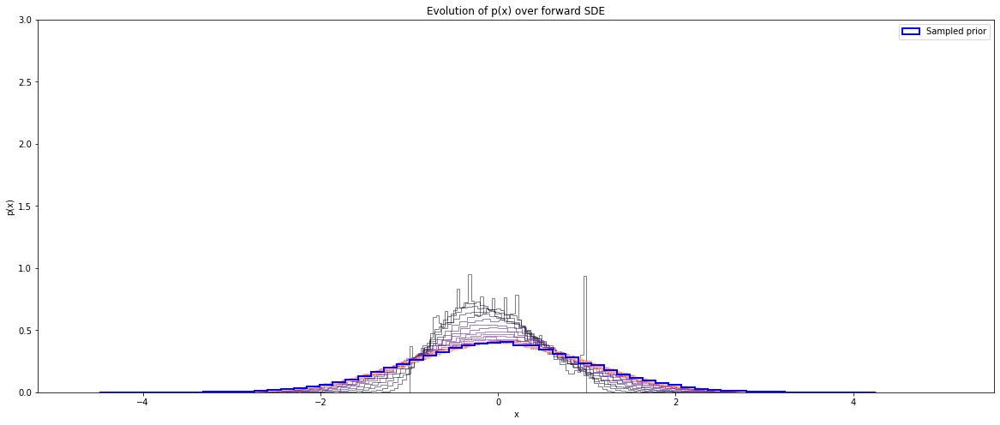

In [8]:
# Show some images after running the SDE forward for different times
time_steps = 4

x0, _ = next(iter(data_loader))
x0 = x0.cpu().numpy()

plot_cifar((x0 + 1) / 2, grid_size=(8, 1), clip=True, title="t = 0")
x0 = torch.tensor(x0).to(DEVICE)
for t in np.linspace(0.01, t_limit, time_steps):
    xt, score = sde.forward(x0, torch.full(x0.shape[:1], t).to(DEVICE))
    plot_cifar((xt.cpu().numpy() + 1) / 2, grid_size=(8, 1), clip=True, title=("t = %.2f" % t))
    
# Show the transformation of the distribution of data to the prior distribution
time_steps = 30

all_t = np.linspace(0, t_limit, time_steps)
all_xt = np.empty((len(all_t),) + x0.shape)
for t_i, t in enumerate(all_t):
    xt, _ = sde.forward(x0, torch.ones(len(x0)).to(DEVICE) * t)
    all_xt[t_i] = xt.cpu().numpy()

fig, ax = plt.subplots(figsize=(20, 8))
cmap = plt.get_cmap("magma")
for t_i in range(len(all_t)):
    ax.hist(np.ravel(all_xt[t_i]), bins=60, histtype="step", color=cmap(t_i / len(all_t)), alpha=0.5, density=True)
prior = sde.sample_prior(len(x0), torch.ones(len(x0)).to(DEVICE) * t).cpu().numpy()
ax.hist(np.ravel(prior), bins=60, histtype="step", color="blue", linewidth=2, density=True, label="Sampled prior")
ax.set_xlabel("x")
ax.set_ylabel("p(x)")
ax.set_title("Evolution of p(x) over forward SDE")
ax.set_ylim((0, 3))
plt.legend()
plt.show()

In [9]:
# train_continuous_model.train_ex.run(
#     "train_branched_model",
#     config_updates={
#         "model": model,
#         "sde": sde,
#         "data_loader": data_loader,
#         "class_time_to_branch_index": class_time_to_branch_tensor,
#         "num_epochs": 120,
#         "learning_rate": 1e-4,
#         "t_limit": t_limit,
#         "loss_weighting_type": "empirical_norm"
#     }
# )

In [10]:
model = model_util.load_model(
    cifar_unet.MultitaskUNet,
    os.path.join(
        "/gstore/scratch/u/tsenga5/branched_diffusion/models/trained_models/",
        "cifar_continuous_branched_100classes_small/7/epoch_12_ckpt.pth"
    )
).to(DEVICE)

Sampling class: 0


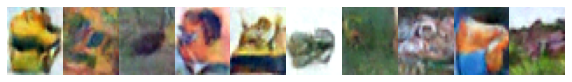

Sampling class: 1


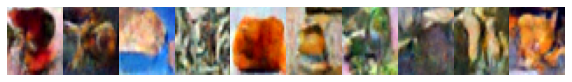

Sampling class: 2


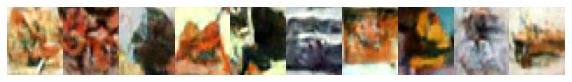

Sampling class: 3


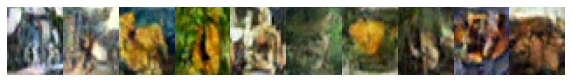

Sampling class: 4


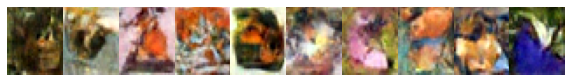

Sampling class: 5


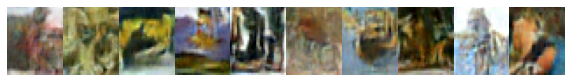

Sampling class: 6


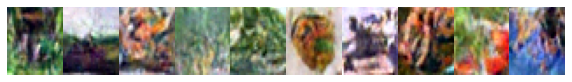

Sampling class: 7


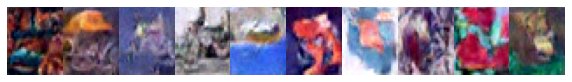

Sampling class: 8


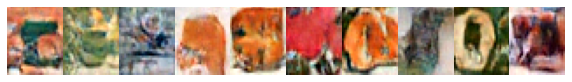

Sampling class: 9


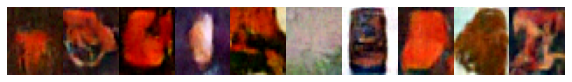

Sampling class: 10


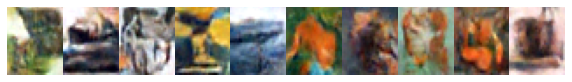

Sampling class: 11


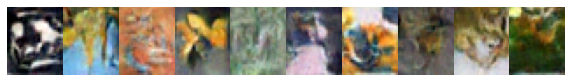

Sampling class: 12


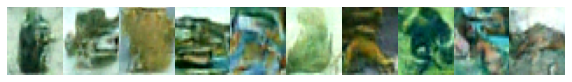

Sampling class: 13


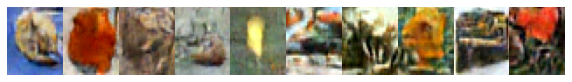

Sampling class: 14


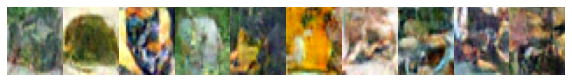

Sampling class: 15


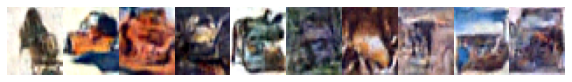

Sampling class: 16


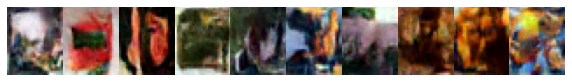

Sampling class: 17


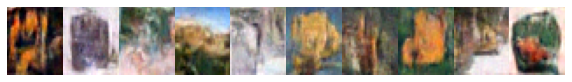

Sampling class: 18


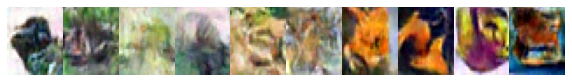

Sampling class: 19


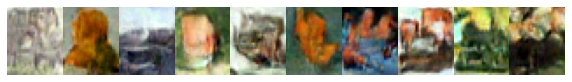

Sampling class: 20


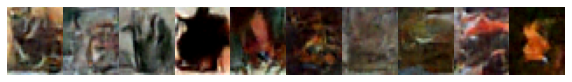

Sampling class: 21


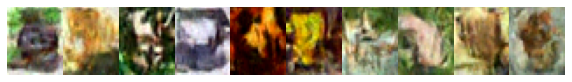

Sampling class: 22


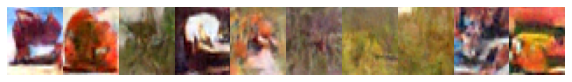

Sampling class: 23


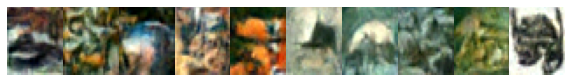

Sampling class: 24


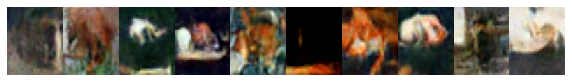

Sampling class: 25


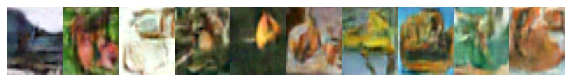

Sampling class: 26


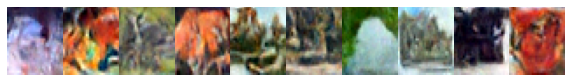

Sampling class: 27


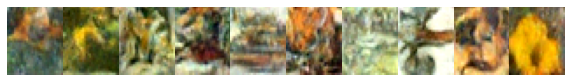

Sampling class: 28


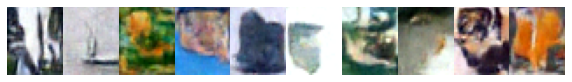

Sampling class: 29


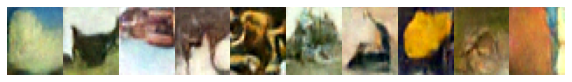

Sampling class: 30


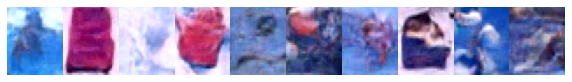

Sampling class: 31


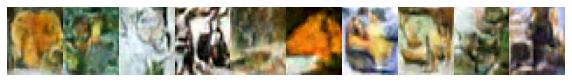

Sampling class: 32


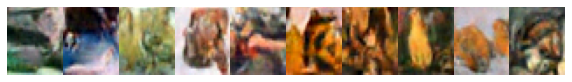

Sampling class: 33


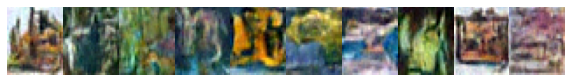

Sampling class: 34


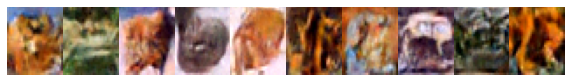

Sampling class: 35


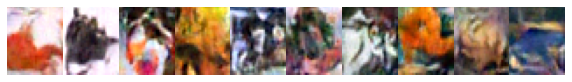

Sampling class: 36


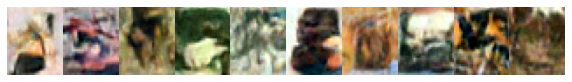

Sampling class: 37


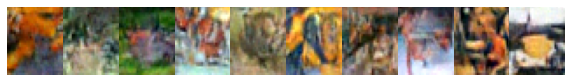

Sampling class: 38


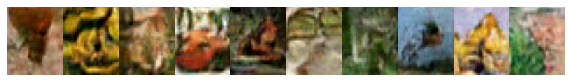

Sampling class: 39


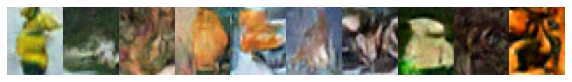

Sampling class: 40


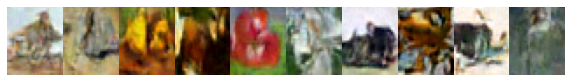

Sampling class: 41


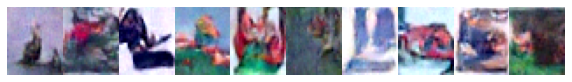

Sampling class: 42


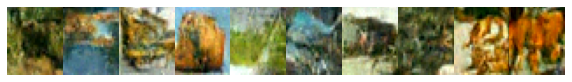

Sampling class: 43


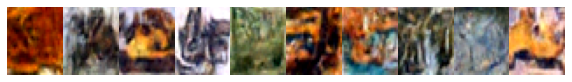

Sampling class: 44


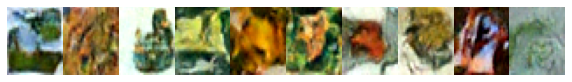

Sampling class: 45


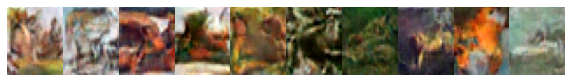

Sampling class: 46


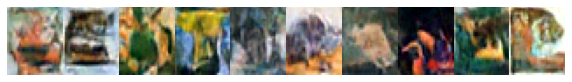

Sampling class: 47


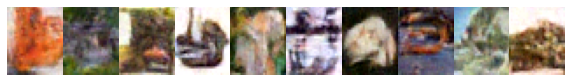

Sampling class: 48


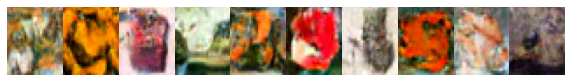

Sampling class: 49


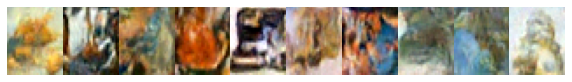

Sampling class: 50


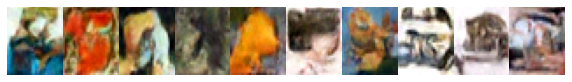

Sampling class: 51


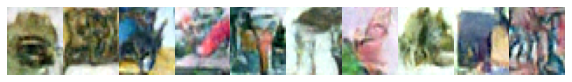

Sampling class: 52


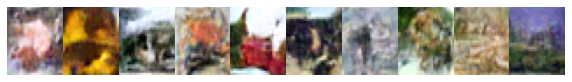

Sampling class: 53


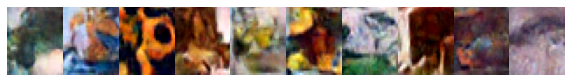

Sampling class: 54


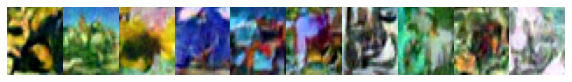

Sampling class: 55


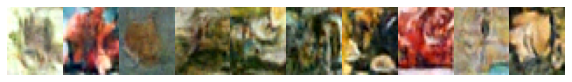

Sampling class: 56


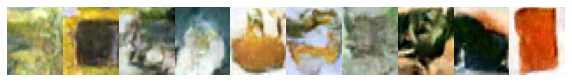

Sampling class: 57


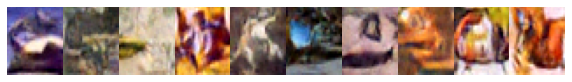

Sampling class: 58


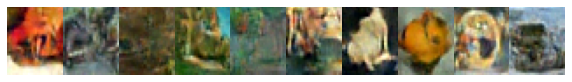

Sampling class: 59


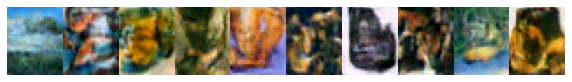

Sampling class: 60


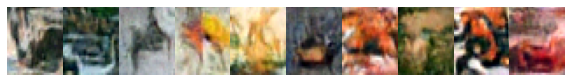

Sampling class: 61


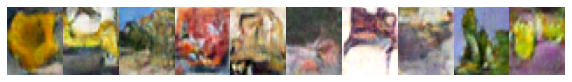

Sampling class: 62


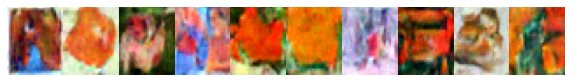

Sampling class: 63


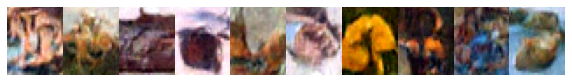

Sampling class: 64


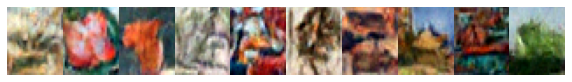

Sampling class: 65


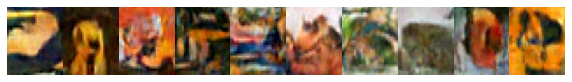

Sampling class: 66


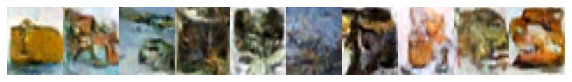

Sampling class: 67


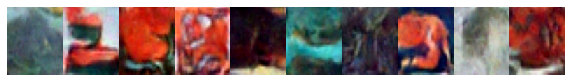

Sampling class: 68


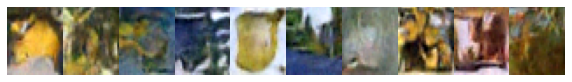

Sampling class: 69


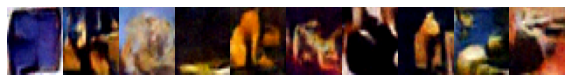

Sampling class: 70


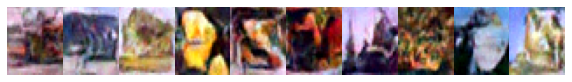

Sampling class: 71


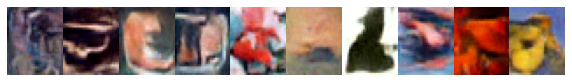

Sampling class: 72


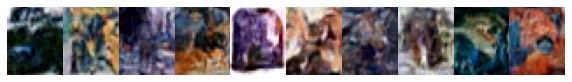

Sampling class: 73


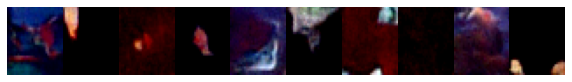

Sampling class: 74


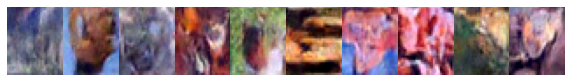

Sampling class: 75


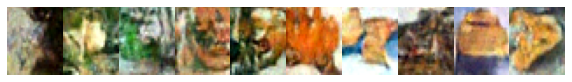

Sampling class: 76


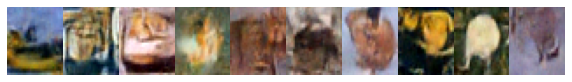

Sampling class: 77


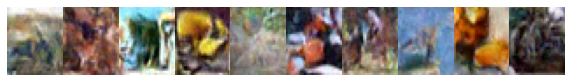

Sampling class: 78


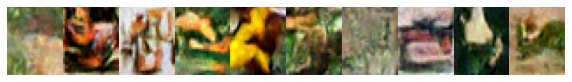

Sampling class: 79


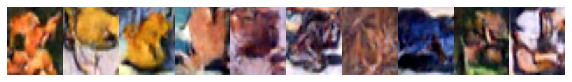

Sampling class: 80


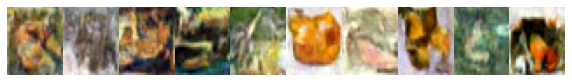

Sampling class: 81


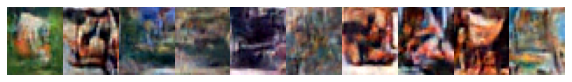

Sampling class: 82


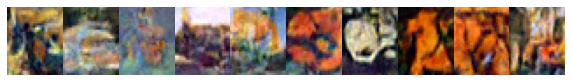

Sampling class: 83


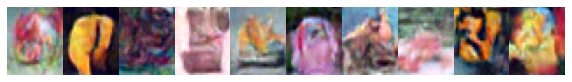

Sampling class: 84


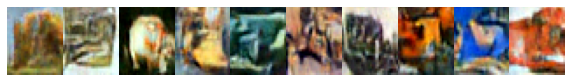

Sampling class: 85


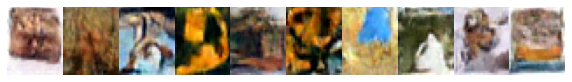

Sampling class: 86


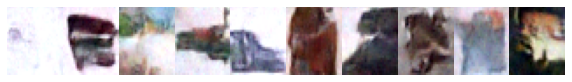

Sampling class: 87


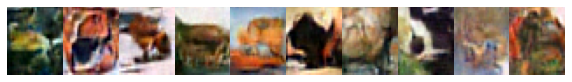

Sampling class: 88


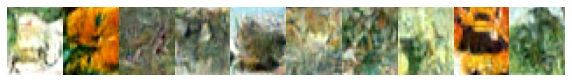

Sampling class: 89


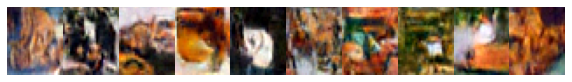

Sampling class: 90


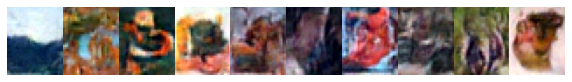

Sampling class: 91


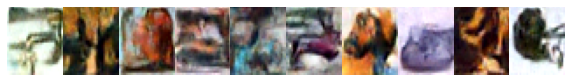

Sampling class: 92


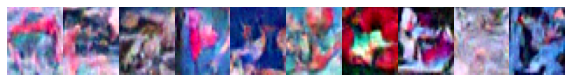

Sampling class: 93


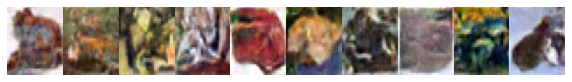

Sampling class: 94


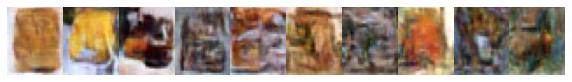

Sampling class: 95


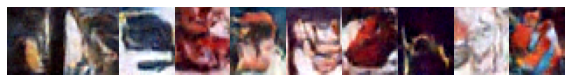

Sampling class: 96


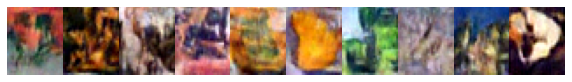

Sampling class: 97


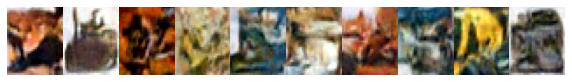

Sampling class: 98


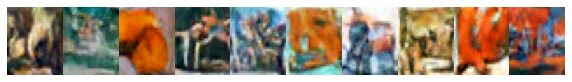

Sampling class: 99


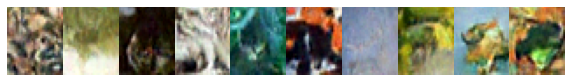

In [11]:
gen_samples = {}
for class_to_sample in classes:
    print("Sampling class: %s" % class_to_sample)
    samples = generate.generate_continuous_branched_samples(
        model, sde, class_to_sample, class_time_to_branch_tensor,
        sampler="pc", t_limit=t_limit
    ).cpu().numpy()
    gen_samples[class_to_sample] = samples
    plot_cifar((samples + 1) / 2, grid_size=(10, 1), clip=True, title=None)
    plt.show()

Sampling class: 0
Sampling class: 1
Sampling class: 2
Sampling class: 3
Sampling class: 4
Sampling class: 5
Sampling class: 6
Sampling class: 7
Sampling class: 8
Sampling class: 9
Sampling class: 10
Sampling class: 11
Sampling class: 12
Sampling class: 13
Sampling class: 14
Sampling class: 15
Sampling class: 16
Sampling class: 17
Sampling class: 18
Sampling class: 19
Sampling class: 20


/local/12934533/ipykernel_19192/752649661.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(


Sampling class: 21
Sampling class: 22
Sampling class: 23
Sampling class: 24
Sampling class: 25
Sampling class: 26
Sampling class: 27
Sampling class: 28
Sampling class: 29
Sampling class: 30
Sampling class: 31
Sampling class: 32
Sampling class: 33
Sampling class: 34
Sampling class: 35
Sampling class: 36
Sampling class: 37
Sampling class: 38
Sampling class: 39
Sampling class: 40
Sampling class: 41
Sampling class: 42
Sampling class: 43
Sampling class: 44
Sampling class: 45
Sampling class: 46
Sampling class: 47
Sampling class: 48
Sampling class: 49
Sampling class: 50
Sampling class: 51
Sampling class: 52
Sampling class: 53
Sampling class: 54
Sampling class: 55
Sampling class: 56
Sampling class: 57
Sampling class: 58
Sampling class: 59
Sampling class: 60
Sampling class: 61
Sampling class: 62
Sampling class: 63
Sampling class: 64
Sampling class: 65
Sampling class: 66
Sampling class: 67
Sampling class: 68
Sampling class: 69
Sampling class: 70
Sampling class: 71
Sampling class: 72
Sampling cla

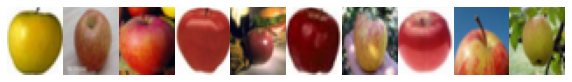

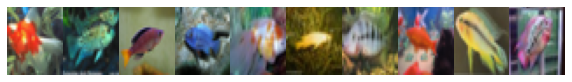

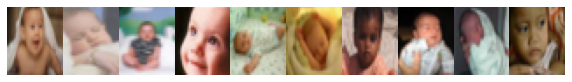

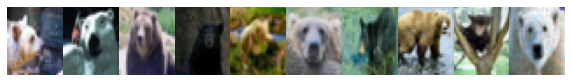

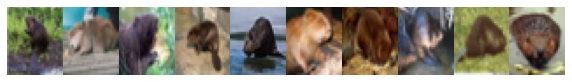

...

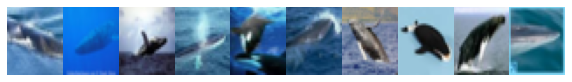

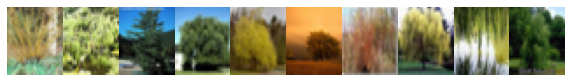

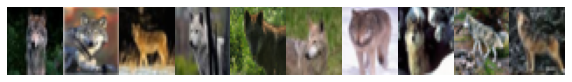

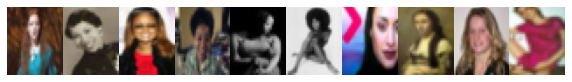

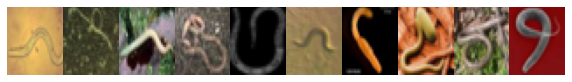

In [12]:
true_samples = {}
for class_to_sample in classes:
    print("Sampling class: %s" % class_to_sample)
    inds = np.where(dataset.targets == class_to_sample)[0]
    sample_inds = np.random.choice(inds, size=200, replace=False)
    samples = np.transpose((dataset.data[sample_inds] / 256 * 2) - 1, (0, 3, 1, 2))
    true_samples[class_to_sample] = samples
    plot_cifar((samples + 1) / 2, grid_size=(10, 1), title=None)

In [13]:
# Compute FID scores
fid_scores = {}
for class_to_sample in classes:
    print("FID of %d" % class_to_sample)
    fid = compute_fid(gen_samples[class_to_sample], true_samples[class_to_sample])
    fid_scores[class_to_sample] = fid
    print("FID: %.4f" % fid)

FID of 0
FID: 494.3292
FID of 1
FID: 722.5595
FID of 2
FID: 494.0159
FID of 3
FID: 344.0668
FID of 4
FID: 369.0651
FID of 5
FID: 416.9791
FID of 6
FID: 458.0610
FID of 7
FID: 570.8442
FID of 8
FID: 421.9661
FID of 9
FID: 867.1627
FID of 10
FID: 435.5917
FID of 11
FID: 487.3431
FID of 12
FID: 504.3661
FID of 13
FID: 493.8693
FID of 14
FID: 436.0429
FID of 15
FID: 349.5527
FID of 16
FID: 547.1023
FID of 17
FID: 519.4600
FID of 18
FID: 364.2810
FID of 19
FID: 382.6992
FID of 20
FID: 2865.5691
FID of 21
FID: 449.9853
FID of 22
FID: 646.9758
FID of 23
FID: 582.7321
FID of 24
FID: 2446.0627
FID of 25
FID: 402.5297
FID of 26
FID: 490.2866
FID of 27
FID: 378.5411
FID of 34
FID: 389.0918
FID of 35
FID: 508.0859
FID of 36
FID: 525.1282
FID of 37
FID: 573.4151
FID of 38
FID: 337.3485
FID of 39
FID: 620.9474
FID of 40
FID: 665.9481
FID of 41
FID: 742.6768
FID of 42
FID: 406.9662
FID of 43
FID: 420.6357
FID of 44
FID: 430.3733
FID of 45
FID: 446.7642
FID of 46
FID: 435.6545
FID of 47
FID: 432.8972


In [14]:
fid_scores

{0: 494.32921167255995,
 1: 722.5594982645523,
 2: 494.01585893192987,
 3: 344.06678181893415,
 4: 369.0651396693801,
 5: 416.97914791657496,
 6: 458.06103781872196,
 7: 570.8442378519708,
 8: 421.966148926576,
 9: 867.1626550554691,
 10: 435.59165337916636,
 11: 487.3431247528154,
 12: 504.36609223325183,
 13: 493.86929447402736,
 14: 436.04287237157956,
 15: 349.5526670047874,
 16: 547.1023276022604,
 17: 519.4600196769659,
 18: 364.2809550337062,
 19: 382.6991859169785,
 20: 2865.569094753899,
 21: 449.9853432057245,
 22: 646.9758362430362,
 23: 582.7321482010063,
 24: 2446.0627298406444,
 25: 402.5296554593571,
 26: 490.28660255421426,
 27: 386.7299027147919,
 28: 543.8597719047162,
 29: 549.1494059877579,
 30: 537.5485349715384,
 31: 424.3651564268864,
 32: 431.3777124795,
 33: 378.54106560042976,
 34: 389.09181172241864,
 35: 508.08592227037974,
 36: 525.1282226775335,
 37: 573.4151061148243,
 38: 337.34851132269273,
 39: 620.9473577579957,
 40: 665.9480552908437,
 41: 742.676813